In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.nn.parallel
import torch.optim as optim
from torch.utils.data import DataLoader
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils


import math
import random
import numpy as np
import os
import argparse
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

In [20]:
seed = 999
random.seed(seed)
torch.manual_seed(seed)

In [3]:
# parameter
parser = argparse.ArgumentParser(description='HyperParameters of DCGAN')
parser.add_argument("--n_epochs", type=int, default=5, help="number of epochs of training")
parser.add_argument("--batch_size", type=int, default=128, help="size of the batches")
parser.add_argument("--lr", type=float, default=0.0002, help="adam: learning rate")
parser.add_argument("--b1", type=float, default=0.5, help="adam: decay of first order momentum of gradient")
parser.add_argument("--b2", type=float, default=0.999, help="adam: decay of first order momentum of gradient")
parser.add_argument("--n_cpu", type=int, default=8, help="number of cpu threads to use during batch generation")
parser.add_argument("--latent_dim", type=int, default=100, help="dimensionality of the latent space")
parser.add_argument("--img_size", type=int, default=64, help="size of each image dimension")
parser.add_argument("--channels", type=int, default=3, help="number of image channels")
parser.add_argument("--sample_interval", type=int, default=400, help="interval betwen image samples")

args = parser.parse_args('')
print(args)

Namespace(n_epochs=5, batch_size=128, lr=0.0002, b1=0.5, b2=0.999, n_cpu=8, latent_dim=100, img_size=64, channels=3, sample_interval=400)


cuda:0


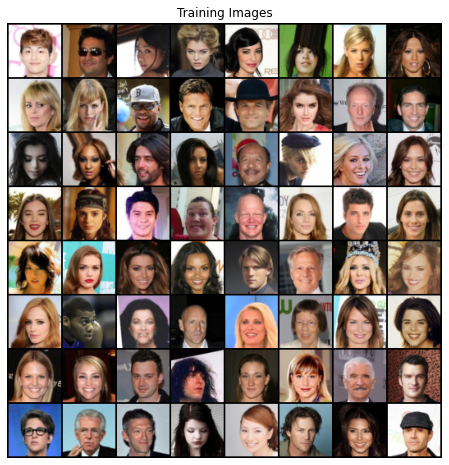

In [4]:
dataset = dset.ImageFolder(root='../data/celeba',
                           transform=transforms.Compose([
                               transforms.Resize(args.img_size),
                               transforms.CenterCrop(args.img_size),
                               transforms.ToTensor(),
                               transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
                           ]))

dataloader = DataLoader(
  dataset,
  batch_size=args.batch_size,
  shuffle=True,
  num_workers=int(args.n_cpu/2)
)

# USE_CUDA
DEVICE = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(DEVICE)

real_batch = next(iter(dataloader))
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(DEVICE)[:64], padding=2, normalize=True).cpu(),(1,2,0)))

In [5]:
def weights_init_normal(m):
  classname = m.__class__.__name__
  if classname.find('Conv') != -1:
    nn.init.normal_(m.weight.data, 0.0, 0.02)
  elif classname.find('BatchNorm2d') != -1:
    nn.init.normal_(m.weight.data, 1.0, 0.02)
    nn.init.constant_(m.bias.data, 0.0)

In [21]:
class Generator(nn.Module):
  def __init__(self):
    super(Generator, self).__init__()

    def block(input_dim, ouput_dim, kernel_size, stride, padding):
      layers=[
        nn.ConvTranspose2d(input_dim, ouput_dim, kernel_size, stride, padding, bias=False),
        nn.BatchNorm2d(ouput_dim),
        nn.ReLU(inplace=True)
      ]
      
      return layers

    self.model = nn.Sequential(
      # B x 100 x 1 x 1
      *block(args.latent_dim, 512, 4, 1, 0),
      # B x 512 x 4 x 4
      *block(512, 256, 4, 2, 1),
      # B x 256 x 8 x 8
      *block(256, 128, 4, 2, 1),
      # B x 128 x 16 x 16
      *block(128, 64, 4, 2, 1),
      # B x 64 x 32 x 32
      nn.ConvTranspose2d(64, args.channels, 4, 2, 1, bias=False),
      # B x 3 x 64 x 64
      nn.Tanh()
    )

  def forward(self, z):
    return self.model(z)

In [22]:
netG = Generator().to(DEVICE)
netG.apply(weights_init_normal)
print(netG)

Generator(
  (model): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)

In [26]:
class Discriminator(nn.Module):
  def __init__(self):
    super(Discriminator, self).__init__()

    def block(input_dim, ouput_dim, kernel_size, stride, padding):
      layers=[
        nn.Conv2d(input_dim, ouput_dim, kernel_size, stride, padding, bias=False),
        nn.BatchNorm2d(ouput_dim),
        nn.LeakyReLU(0.2, inplace=True)
      ]
      
      return layers


    self.model = nn.Sequential(
      # B x 3 x 64 x 64
      nn.Conv2d(args.channels, 64, 4, 2, 1, bias=False),
      nn.LeakyReLU(0.2, inplace=True),
      # B x 64 x 32 x 32
      *block(64, 128, 4, 2, 1),
      # B x 128 x 16 x 16
      *block(128, 256, 4, 2, 1),
      # B x 256 x 8 x 8
      *block(256, 512, 4, 2, 1),
      # B x 512 x 4 x 4
      nn.Conv2d(512, 1, 4, 1, 0, bias=False),
      # B x 1 x 1 x 1
      nn.Sigmoid()
    )

  def forward(self, img):
    return self.model(img)

In [27]:
netD = Discriminator().to(DEVICE)
netD.apply(weights_init_normal)
print(netD)

Discriminator(
  (model): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (12): Sigmoid()
  )
)


In [28]:
criterion = nn.BCELoss()

fixed_noise = torch.randn(64, args.latent_dim, 1, 1, device=DEVICE)

optimizer_D = optim.Adam(netD.parameters(), lr=args.lr, betas=(args.b1, args.b2))
optimizer_G = optim.Adam(netG.parameters(), lr=args.lr, betas=(args.b1, args.b2))

Tensor = torch.cuda.FloatTensor if torch.cuda.is_available() else torch.FloatTensor

In [29]:
img_list = []
G_losses = []
D_losses = []

iters = 0
real_label = 1.
fake_label = 0.

for epoch in range(args.n_epochs):
  for idx, (imgs, _) in enumerate(dataloader):
    
    # 이미지 타입 변경
    imgs = imgs.to(DEVICE)
    
    # 레이블 생성
    # args.batch_size가 아닌 dataloader에서 받은 size사용해야함 
    b_size = imgs.size(0)
    label = torch.full((b_size,), real_label, dtype=torch.float, device=DEVICE)

    ###
    # D network : maximize log(D(x)) + log(1 - D(G(z)))
    ###
    netD.zero_grad()

    # 실제 이미지 loss : D(x)
    output = netD(imgs).view(-1)
    real_loss = criterion(output, label)
    real_loss.backward() # 미분 계산
    D_x = output.mean().item()

    # 생성 이미지 loss : 1-G(D(z))
    z = torch.randn(b_size, args.latent_dim, 1, 1, device=DEVICE)
    fake_img = netG(z)
    label.fill_(fake_label)
    output = netD(fake_img.detach()).view(-1) # detach 중요!
    fake_loss = criterion(output, label)
    fake_loss.backward() # 미분 계산
    D_G_z1 = output.mean().item()

    D_loss = real_loss + fake_loss
    optimizer_D.step()

    ###
    # G network : maximize log(D(G(z)))
    ###

    netG.zero_grad()
    label.fill_(real_label)
    output = netD(fake_img).view(-1)
    G_loss = criterion(output, label)
    G_loss.backward()
    D_G_z2 = output.mean().item()
    optimizer_G.step()


    G_losses.append(G_loss.item())
    D_losses.append(D_loss.item())

    if idx % 50 == 0:
      print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
            % (epoch+1, args.n_epochs, idx, len(dataloader),
                D_loss.item(), G_loss.item(), D_x, D_G_z1, D_G_z2))
    
    if (iters % 500 == 0) or ((epoch == args.n_epochs-1) and (idx == len(dataloader)-1)):
        with torch.no_grad():
            fake = netG(fixed_noise).detach().cpu()
        img_list.append(vutils.make_grid(fake, padding=2, normalize=True))

    iters += 1


[1/5][0/1583]	Loss_D: 1.3632	Loss_G: 3.8572	D(x): 0.4775	D(G(z)): 0.3478 / 0.0296
[1/5][50/1583]	Loss_D: 0.4204	Loss_G: 16.9921	D(x): 0.9910	D(G(z)): 0.2477 / 0.0000
[1/5][100/1583]	Loss_D: 0.0389	Loss_G: 37.7582	D(x): 0.9862	D(G(z)): 0.0000 / 0.0000
[1/5][150/1583]	Loss_D: 1.3099	Loss_G: 5.4323	D(x): 0.5152	D(G(z)): 0.0039 / 0.0460
[1/5][200/1583]	Loss_D: 1.6838	Loss_G: 4.2513	D(x): 0.3352	D(G(z)): 0.0057 / 0.0451
[1/5][250/1583]	Loss_D: 1.0375	Loss_G: 6.7424	D(x): 0.8007	D(G(z)): 0.4567 / 0.0036
[1/5][300/1583]	Loss_D: 0.6717	Loss_G: 4.3706	D(x): 0.7428	D(G(z)): 0.2232 / 0.0194
[1/5][350/1583]	Loss_D: 0.4518	Loss_G: 4.9530	D(x): 0.9766	D(G(z)): 0.3133 / 0.0107
[1/5][400/1583]	Loss_D: 0.4005	Loss_G: 4.0364	D(x): 0.8289	D(G(z)): 0.1491 / 0.0301
[1/5][450/1583]	Loss_D: 0.9558	Loss_G: 9.2736	D(x): 0.9205	D(G(z)): 0.5095 / 0.0006
[1/5][500/1583]	Loss_D: 0.7611	Loss_G: 2.0699	D(x): 0.6026	D(G(z)): 0.0645 / 0.1868
[1/5][550/1583]	Loss_D: 0.5180	Loss_G: 4.7739	D(x): 0.6660	D(G(z)): 0.0164 / 

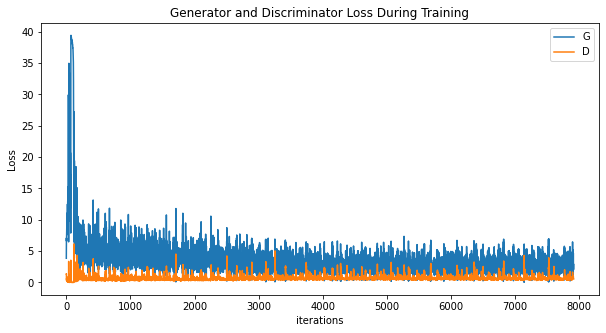

In [30]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

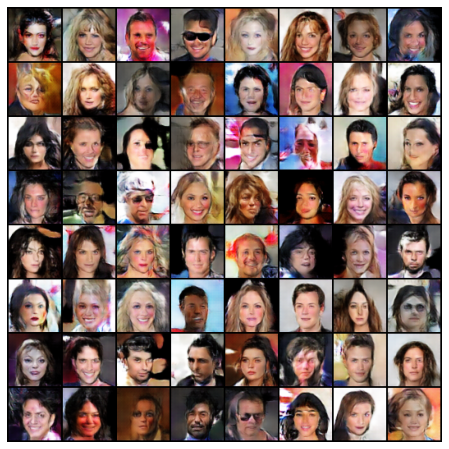

In [31]:
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

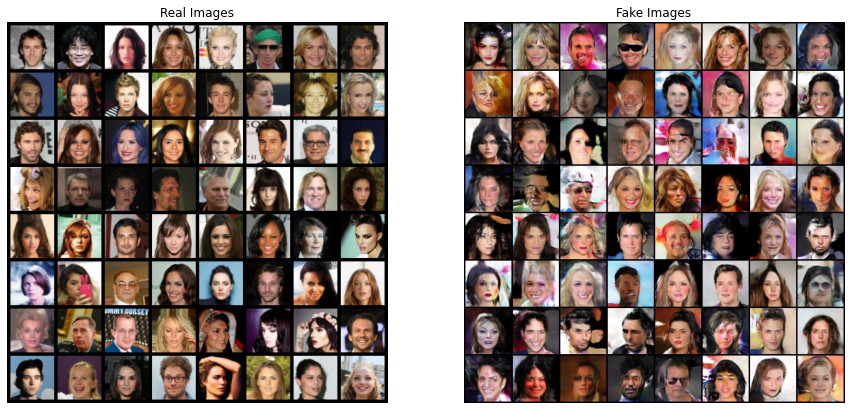

In [32]:
# Grab a batch of real images from the dataloader
real_batch = next(iter(dataloader))

# Plot the real images
plt.figure(figsize=(15,15))
plt.subplot(1,2,1)
plt.axis("off")
plt.title("Real Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(DEVICE)[:64], padding=5, normalize=True).cpu(),(1,2,0)))

# Plot the fake images from the last epoch
plt.subplot(1,2,2)
plt.axis("off")
plt.title("Fake Images")
plt.imshow(np.transpose(img_list[-1],(1,2,0)))
plt.show()